# Set Filepaths

In [1]:
import os
cwd = os.getcwd()

''' Need to change the below two inputs to your local filepath. ./ did not work for image files for some reason'''
experiment_name = 'gqaSG'
image_directory = cwd+'/data/images/' # change to local image directory
attention_image_directory = cwd+'/preds/' +experiment_name + '/valImages/' #Change to Prediction Directory

data_location = './data/'
sceneGraph = True

if sceneGraph:
    file_objects = data_location+'gqa_objects_sg.h5'
    file_merged_smy = data_location+'gqa_objects_sg_merged_info.json'
else:
    file_objects = data_location+'gqa_objects.h5'
    file_merged_smy = data_location+'gqa_objects_merged_info.json'

# Load Network

In [2]:
%%capture
from __future__ import division
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message="size changed")

import sys 
is_py2 = sys.version[0] == '2'
if is_py2:
    import Queue as queue
else:
    import queue as queue

from collections import defaultdict
from termcolor import colored, cprint
import tensorflow as tf
import numpy as np
import threading
import random
import os
import time
import math
import h5py
import json

import cv2
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import patches
from PIL import Image

from config import config, loadDatasetConfig, parseArgs
from preprocess import Preprocesser, bold, bcolored, writeline, writelist
from model import MACnet


In [3]:
############################################# loggers #############################################

# Writes log header to file 
def logInit():
    with open(config.logFile(), "a+") as outFile:
        writeline(outFile, config.expName)
        headers = ["epoch", "trainAcc", "valAcc", "trainLoss", "valLoss"]
        if config.evalTrain:
            headers += ["evalTrainAcc", "evalTrainLoss"]
        if config.extra:
            if config.evalTrain:
                headers += ["thAcc", "thLoss"]
            headers += ["vhAcc", "vhLoss"]
        headers += ["time", "lr"]

        writelist(outFile, headers)
        # lr assumed to be last

# Writes log record to file 
def logRecord(epoch, epochTime, lr, trainRes, evalRes, extraEvalRes):
    with open(config.logFile(), "a+") as outFile:
        record = [epoch, trainRes["acc"], evalRes["val"]["acc"], trainRes["loss"], evalRes["val"]["loss"]]
        if config.evalTrain:
            record += [evalRes["train"]["acc"], evalRes["train"]["loss"]]
        if config.extra:
            if config.evalTrain:
                record += [extraEvalRes["train"]["acc"], extraEvalRes["train"]["loss"]]
            record += [extraEvalRes["val"]["acc"], extraEvalRes["val"]["loss"]]
        record += [epochTime, lr]

        writelist(outFile, record)

# Gets last logged epoch and learning rate
def lastLoggedEpoch():
    with open(config.logFile(), "r") as inFile:
        lastLine = list(inFile)[-1].split(",") 
    epoch = int(lastLine[0])
    lr = float(lastLine[-1])   
    return epoch, lr 

################################## printing, output and analysis ##################################

# Analysis by type
analysisQuestionLims = [(0,18),(19,float("inf"))]
analysisProgramLims = [(0,12),(13,float("inf"))]

toArity = lambda instance: instance["programSeq"][-1].split("_", 1)[0]
toType = lambda instance: "boolean" if (instance["answer"] in ["yes", "no"]) else "open"
toQType = lambda instance: instance["questionType"]
toAType = lambda instance: instance["answerType"]

def fieldLenIsInRange(field):
    return lambda instance, group: \
        (len(instance[field]) >= group[0] and
        len(instance[field]) <= group[1])

# Groups instances based on a key
def grouperKey(toKey):
    def grouper(instances):
        res = defaultdict(list)
        for instance in instances:
            res[toKey(instance)].append(instance)
        return res
    return grouper

# Groups instances according to their match to condition
def grouperCond(groups, isIn):
    def grouper(instances):
        res = {}
        for group in groups:
            res[group] = (instance for instance in instances if isIn(instance, group))
        return res
    return grouper 

groupers = {
    "questionLength": grouperCond(analysisQuestionLims, fieldLenIsInRange("question")),
    "programLength": grouperCond(analysisProgramLims, fieldLenIsInRange("programSeq")),
    "arity": grouperKey(toArity),
    "type": grouperKey(toType),
    "qType": grouperKey(toQType),
    "aType": grouperKey(toAType)
}

# Computes average
def avg(instances, field):
    if len(instances) == 0:
        return 0.0
    return sum([(1 if instance["prediction"] == instance["answer"] else 0) for instance in instances]) / len(instances)

# Prints analysis of questions loss and accuracy by their group 
def printAnalysis(res):
    if config.analysisType != "":
        print("Analysis by {type}".format(type = config.analysisType))
        groups = groupers[config.analysisType](res["preds"])
        for key in groups:
            instances = groups[key]
            # avgLoss = avg(instances, "loss") avgLoss
            avgAcc = avg(instances, "acc")
            num = len(instances)
            print("Group {key}: Loss: {loss}, Acc: {acc}, Num: {num}".format(key = key, loss = 0, acc = avgAcc, num = num))

# Print results for a tier
def printTierResults(tierName, res, color):
    if res is None:
        return

    print("{tierName} Loss: {loss}, {tierName} accuracy: {acc}, minLoss: {minLoss}, maxAcc: {maxAcc}".format(tierName = tierName,
        loss = bcolored(res["loss"], color), 
        acc = bcolored(res["acc"], color),
        minLoss = bcolored(res["minLoss"], color),
        maxAcc = bcolored(res["maxAcc"], color)))
    
    printAnalysis(res)

# Prints dataset results (for several tiers)
def printDatasetResults(trainRes, evalRes, extraEvalRes):
    printTierResults("Training", trainRes, "magenta")
    printTierResults("Training EMA", evalRes["train"], "red")
    printTierResults("Validation", evalRes["val"], "cyan")
    printTierResults("Extra Training EMA", extraEvalRes["train"], "red")
    printTierResults("Extra Validation", extraEvalRes["val"], "cyan")    

# Writes predictions for several tiers
def writePreds(preprocessor, evalRes, extraEvalRes):
    preprocessor.writePreds(evalRes["train"], "train")
    preprocessor.writePreds(evalRes["val"], "val")
    preprocessor.writePreds(evalRes["test"], "test")
    preprocessor.writePreds(extraEvalRes["train"], "train", "H")
    preprocessor.writePreds(extraEvalRes["val"], "val", "H")
    preprocessor.writePreds(extraEvalRes["test"], "test", "H")

def inp(msg):
    if sys.version_info[0] < 3:
        return raw_input(msg)
    else:
        return input(msg)

############################################# session #############################################
# Initializes TF session. Sets GPU memory configuration.
def setSession():
    sessionConfig = tf.ConfigProto(allow_soft_placement = True, log_device_placement = False)
    if config.allowGrowth:
        sessionConfig.gpu_options.allow_growth = True
    if config.maxMemory < 1.0:
        sessionConfig.gpu_options.per_process_gpu_memory_fraction = config.maxMemory
    return sessionConfig

############################################## savers #############################################
# Initializes savers (standard, optional exponential-moving-average and optional for subset of variables)
def setSavers(model):
    saver = tf.train.Saver(max_to_keep = config.weightsToKeep)

    subsetSaver = None
    if config.saveSubset:
        isRelevant = lambda var: any(s in var.name for s in config.varSubset)
        relevantVars = [var for var in tf.global_variables() if isRelevant(var)]
        subsetSaver = tf.train.Saver(relevantVars, max_to_keep = config.weightsToKeep, allow_empty = True)
    
    emaSaver = None
    if config.useEMA: 
        emaSaver = tf.train.Saver(model.emaDict, max_to_keep = config.weightsToKeep)

    return {
        "saver": saver,
        "subsetSaver": subsetSaver,
        "emaSaver": emaSaver
    }

################################### restore / initialize weights ##################################
# Restores weights of specified / last epoch if on restore mod.
# Otherwise, initializes weights.  
def loadWeights(sess, saver, init):
    if config.restoreEpoch > 0 or config.restore:
        # restore last epoch only if restoreEpoch isn't set
        if config.restoreEpoch == 0:
            # restore last logged epoch
            config.restoreEpoch, config.lr = lastLoggedEpoch()
        #print(bcolored("Restoring epoch {} and lr {}".format(config.restoreEpoch, config.lr),"cyan"))
        #print(bcolored("Restoring weights", "blue"))
        saver.restore(sess, config.weightsFile(config.restoreEpoch))
        epoch = config.restoreEpoch
    else:
        print(bcolored("Initializing weights", "blue"))
        sess.run(init)
        logInit()
        epoch = 0

    return epoch 

###################################### training / evaluation ######################################
# Chooses data to train on (main / extra) data. 
def chooseTrainingData(data):
    trainingData = data["main"]["train"]
    alterData = None

    if config.extra:
        if config.trainExtra:
            if config.extraVal:
                trainingData = data["extra"]["val"]
            else:
                trainingData = data["extra"]["train"]                  
        if config.alterExtra:
            alterData = data["extra"]["train"]

    return trainingData, alterData

#### evaluation
# Runs evaluation on train / val / test datasets.
def runEvaluation(sess, model, data, dataOps, epoch, evalTrain = True, evalTest = False, 
    getPreds = False, getAtt = None, prevRes = None):
    if getAtt is None:
        getAtt = config.getAtt
    res = {"train": None, "val": None, "test": None}
    
    if data is not None:
        if evalTrain and config.evalTrain:
            res["train"] = runEpoch(sess, model, data["evalTrain"], dataOps, train = False, epoch = epoch, getPreds = getPreds, getAtt = getAtt, 
                maxAcc = prevRes["train"]["maxAcc"] if prevRes else 0.0,
                minLoss = prevRes["train"]["minLoss"] if prevRes else float("inf"))

        res["val"] = runEpoch(sess, model, data["val"], dataOps, train = False, epoch = epoch, getPreds = getPreds, getAtt = getAtt, 
            maxAcc = prevRes["val"]["maxAcc"] if prevRes else 0.0,
            minLoss = prevRes["val"]["minLoss"] if prevRes else float("inf"))
        
        if evalTest or config.test:
            res["test"] = runEpoch(sess, model, data["test"], dataOps, train = False, epoch = epoch, getPreds = getPreds, getAtt = getAtt, 
                maxAcc = prevRes["test"]["maxAcc"] if prevRes else 0.0,
                minLoss = prevRes["test"]["minLoss"] if prevRes else float("inf"))    
        
    return res

## training conditions (comparing current epoch result to prior ones)
def improveEnough(curr, prior, lr):
    prevRes = prior["prev"]["res"]
    currRes = curr["res"]

    if prevRes is None:
        return True

    prevTrainLoss = prevRes["train"]["loss"]
    currTrainLoss = currRes["train"]["loss"]
    lossDiff = prevTrainLoss - currTrainLoss
    
    ## FOR CLEVR
    if config.dataset == "CLEVR":
        notImprove = ((lossDiff < 0.015 and prevTrainLoss < 0.5 and lr > 0.00002) or \
                      (lossDiff < 0.008 and prevTrainLoss < 0.15 and lr > 0.00001) or \
                      (lossDiff < 0.003 and prevTrainLoss < 0.10 and lr > 0.000005))
                      #(prevTrainLoss < 0.2 and config.lr > 0.000015)
    else:
        notImprove = (lossDiff < 0.02 and lr > 0.00005)
                      #(prevTrainLoss < 0.2 and config.lr > 0.000015)

    return not notImprove

def better(currRes, bestRes):
    return currRes["val"]["acc"] > bestRes["val"]["acc"]

############################################## data ###############################################
#### instances and batching 
# Trims sequences based on their max length.
def trim2DVectors(vectors, vectorsLengths):
    maxLength = np.max(vectorsLengths)
    return vectors[:,:maxLength]

# Trims batch based on question length.
def trimData(data):
    data["questions"] = trim2DVectors(data["questions"], data["questionLengths"])
    return data

# Gets batch / bucket size.
def getLength(data):
    return len(data["indices"]) # len(data["instances"])

# Selects the data entries that match the indices. 
def selectIndices(data, indices):
    def select(field, indices): 
        if type(field) is np.ndarray:
            return field[indices]
        if type(field) is list:
            return [field[i] for i in indices]
        else:
            return field
    selected = {k : select(d, indices) for k,d in data.items()}
    return selected

# Batches data into a a list of batches of batchSize. 
# Shuffles the data by default.
def getBatches(data, batchSize = None, shuffle = True):
    batches = []

    dataLen = getLength(data)
    if batchSize is None or batchSize > dataLen:
        batchSize = dataLen
    
    indices = np.arange(dataLen)
    if shuffle:
        np.random.shuffle(indices)

    for batchStart in range(0, dataLen, batchSize):
        batchIndices = indices[batchStart : batchStart + batchSize]
        # if len(batchIndices) == batchSize?
        if len(batchIndices) >= config.gpusNum:
            batch = selectIndices(data, batchIndices)
            batches.append(batch)
            # batchesIndices.append((data, batchIndices))

    return batches

#### image batches
# Opens image files.
def openImageFiles(images):
    for group in images:
        images[group]["imagesFile"] = h5py.File(images[group]["imagesFilename"], "r")
        if config.dataset != "CLEVR":
            with open(images[group]["imgsInfoFilename"], "r") as file:
                images[group]["imgsInfo"] = json.load(file) 

# Closes image files.
def closeImageFiles(images): 
    for group in images:
        images[group]["imagesFile"].close()

# Loads an images from file for a given data batch.
def loadImageBatch(images, batch):
    imagesGroup = lambda imageId: images[imageId["group"]]
    toFile = lambda imageId: imagesGroup(imageId)["imagesFile"]
    toInfo = lambda imageId: imagesGroup(imageId)["imgsInfo"][str(imageId["id"])]

    if config.imageObjects:
        imageBatch = np.zeros((len(batch["imageIds"]), config.imageDims[0], config.imageDims[1]))
        for i, imageId in enumerate(batch["imageIds"]):
            numObjects = toInfo(imageId)["objectsNum"]

            imageBatch[i, 0:numObjects] = toFile(imageId)["features"][imageId["idx"], 0:numObjects]

    else:
        imageBatch = np.stack([toFile(imageId)["features"][imageId["idx"]]     
            for imageId in batch["imageIds"]], axis = 0)

        config.imageDims = imageBatch.shape[1:]
    
    ret = {"images": imageBatch, "imageIds": batch["imageIds"]}
    
    return ret 

# Loads images for several num batches in the batches list from start index. 
def loadImageBatches(images, batches, start, num):
    batches = batches[start: start + num]
    return [loadImageBatch(images, batch) for batch in batches]

#### data alternation
# Alternates main training batches with extra data.
def alternateData(batches, alterData, dataLen):
    alterData = alterData["data"][0] # data isn't bucketed for altered data

    # computes number of repetitions
    needed = math.ceil(len(batches) / config.alterNum) 
    print(bold("Extra batches needed: %d") % needed)
    perData = math.ceil(getLength(alterData) / config.batchSize)
    print(bold("Batches per extra data: %d") % perData)
    repetitions = math.ceil(needed / perData)
    print(bold("reps: %d") % repetitions)
    
    # make alternate batches
    alterBatches = []
    for _ in range(repetitions):
        repBatches = getBatches(alterData, batchSize = config.batchSize)
        random.shuffle(repBatches)
        alterBatches += repBatches
    print(bold("Batches num: %d") + len(alterBatches))
    
    # alternate data with extra data
    curr = len(batches) - 1
    for alterBatch in alterBatches:
        if curr < 0:
            break
        batches.insert(curr, alterBatch)
        dataLen += getLength(alterBatch)
        curr -= config.alterNum

    return batches, dataLen

############################################ threading ############################################

imagesQueue = queue.Queue(maxsize = 20) # config.tasksNum
inQueue = queue.Queue(maxsize = 1)
outQueue = queue.Queue(maxsize = 1)

def loaderRun(images, batches):
    batchNum = 0

    while batchNum < len(batches):
        nextItem = loadImageBatches(images, batches, batchNum, config.taskSize)
        assert len(nextItem) == min(config.taskSize, len(batches) - batchNum)
        batchNum += config.taskSize                    
        imagesQueue.put(nextItem)

########################################## stats tracking #########################################
# Computes exponential moving average.
def emaAvg(avg, value):
    if avg is None:
        return value
    emaRate = 0.98
    return avg * emaRate + value * (1 - emaRate)

# Initializes training statistics.
def initStats():
    return {
        "totalBatches": 0,
        "totalData": 0,
        "totalLoss": 0.0,
        "totalCorrect": 0,
        "totalAcc": 0.0,
        "loss": 0.0,
        "acc": 0.0,
        "emaLoss": None,
        "emaAcc": None,
    }

# Updates statistics with training results of a batch
def updateStats(stats, res): 
    stats["totalBatches"] += 1
    stats["totalData"] += res["batchSize"]

    stats["totalLoss"] += res["loss"]
    stats["totalCorrect"] += res["correctNum"]
    stats["totalAcc"] += res["acc"]

    stats["loss"] = stats["totalLoss"] / stats["totalBatches"]
    stats["acc"] = stats["totalCorrect"] / stats["totalData"]
    
    stats["emaLoss"] = emaAvg(stats["emaLoss"], res["loss"])
    stats["emaAcc"] = emaAvg(stats["emaAcc"], res["acc"])

    return stats 

# Translates training statistics into a string to print
def statsToStr(stats, res, epoch, batchNum, dataLen, startTime):
    formatStr = "\reb {epoch},{batchNum} ({dataProcessed} / {dataLen:5d}), " + \
                             "t = {time} ({loadTime:2.2f}+{trainTime:2.2f}), " + \
                             "lr {lr}, l = {loss}, a = {acc}, avL = {avgLoss}, " + \
                             "avA = {avgAcc}, g = {gradNorm:2.4f}, " + \
                             "emL = {emaLoss:2.4f}, emA = {emaAcc:2.4f}; " + \
                             "{expname}"

    s_epoch = bcolored("{:2d}".format(epoch),"green")
    s_batchNum = "{:3d}".format(batchNum)
    s_dataProcessed = bcolored("{:5d}".format(stats["totalData"]),"green")
    s_dataLen = dataLen
    s_time = bcolored("{:2.2f}".format(time.time() - startTime),"green")
    s_loadTime = res["readTime"] 
    s_trainTime = res["trainTime"]
    s_lr = bold(config.lr)
    s_loss = bcolored("{:2.4f}".format(res["loss"]), "blue")
    s_acc = bcolored("{:2.4f}".format(res["acc"]),"blue")
    s_avgLoss = bcolored("{:2.4f}".format(stats["loss"]), "blue")
    s_avgAcc = bcolored("{:2.4f}".format(stats["acc"]),"red")
    s_gradNorm = res["gradNorm"]  
    s_emaLoss = stats["emaLoss"]
    s_emaAcc = stats["emaAcc"]
    s_expname = config.expName 

    return formatStr.format(epoch = s_epoch, batchNum = s_batchNum, dataProcessed = s_dataProcessed,
                            dataLen = s_dataLen, time = s_time, loadTime = s_loadTime,
                            trainTime = s_trainTime, lr = s_lr, loss = s_loss, acc = s_acc,
                            avgLoss = s_avgLoss, avgAcc = s_avgAcc, gradNorm = s_gradNorm,
                            emaLoss = s_emaLoss, emaAcc = s_emaAcc, expname = s_expname)

'''
Runs an epoch with model and session over the data.
1. Batches the data and optionally mix it with the extra alterData.
2. Start worker threads to load images in parallel to training.
3. Runs model for each batch, and gets results (e.g. loss,  accuracy).
4. Updates and prints statistics based on batch results.
5. Once in a while (every config.saveEvery), save weights. 

Args:
    sess: TF session to run with.
    
    model: model to process data. Has runBatch method that process a given batch.
    (See model.py for further details).
    
    data: data to use for training/evaluation.
    
    epoch: epoch number.

    saver: TF saver to save weights

    calle: a method to call every number of iterations (config.calleEvery)

    alterData: extra data to mix with main data while training.

    getAtt: True to return model attentions.  
'''    
def runEpoch(sess, model, data, dataOps, train, epoch, saver = None, calle = None, 
    alterData = None, getPreds = False, getAtt = False, maxAcc = 0.0, minLoss = float("Inf")):
    dataLen = sum(getLength(bucket) for bucket in data["data"])
    if dataLen == 0:
        return {"loss": 0, 
            "acc": 0,
            "maxAcc": 0,
            "minLoss": 0,
            "preds": []
            }

    # initialization
    startTime0 = time.time()

    stats = initStats()
    preds = []

    # open image files
    openImageFiles(data["images"])

    ## prepare batches
    buckets = data["data"]
    dataLen = sum(getLength(bucket) for bucket in buckets)
    
    # make batches and randomize
    batches = []
    for bucket in buckets:
        batches += getBatches(bucket, batchSize = config.batchSize)
    random.shuffle(batches)

    # alternate with extra data
    if train and alterData is not None:
        batches, dataLen = alternateData(batches, alterData, dataLen)

    # for batchNum, batch in enumerate(batches):  
    batchNum = 0
    batchesNum = len(batches) 

    while batchNum < batchesNum:
        try:
            startTime = time.time()

            # prepare batch 
            batch = batches[batchNum]
            batch = trimData(batch)

            # load images batch
            imagesBatch = loadImageBatch(data["images"], batch)
            for i, imageId in enumerate(batch["imageIds"]):
                assert imageId == imagesBatch["imageIds"][i]   
            
            # run batch
            res = model.runBatch(sess, batch, imagesBatch, train, getPreds, getAtt)

            # update stats
            stats = updateStats(stats, res) # , batch
            preds += res["preds"]

            sys.stdout.write(statsToStr(stats, res, epoch, batchNum, dataLen, startTime))
            sys.stdout.flush()

            # save weights
            if saver is not None:
                if batchNum > 0 and batchNum % config.saveEvery == 0:
                    print("")
                    print(bold("saving weights"))
                    saver.save(sess, config.weightsFile(epoch))

            # calle
            if calle is not None:            
                if batchNum > 0 and batchNum % config.calleEvery == 0:
                    calle()

            batchNum += 1

        except tf.errors.OutOfRangeError:
            break

    sys.stdout.write("\r")
    sys.stdout.flush()

    closeImageFiles(data["images"])

    return {"loss": stats["loss"], 
            "acc": stats["acc"],
            "maxAcc": max(stats["acc"], maxAcc),
            "minLoss": min(stats["loss"], minLoss),
            "preds": preds
            }

In [4]:
%%capture
parseArgs()

SystemExit: 2

# Set Config

In [5]:
config.expName = experiment_name
#config.finalTest = True
#config.test = True
config.interactive = True
config.sceneGraph = sceneGraph
config.getPreds = False
config.netLength = 4
config.restore = True
config.testedNum = 5
config.getAtt = True

In [6]:
config.dataset = 'GQA'
config.dataSubset='balanced'
config.featureType = 'gqa_objects'
config.imageObjects = True
config.stemNormalize = True
config.lossType='sigmoid'
config.npy = True
config.parallel = True
config.evalTrain = True
config.retainVal = True
config.useEMA = True
config.noBucket = True
config.adam = True
config.lrReduce = True
config.clipGradients = True
config.relu = 'ELU'
config.encBi = True
config.initCtrl = 'Q'
config.controlContextual = True
config.controlInputUnshared = True
config.readProjInputs = True
config.readMemConcatKB = True
config.readMemConcatProj = True
config.readMemProj = True
config.readCtrl = True
config.writeMemProj = True
config.memoryVariationalDropout = True
config.outQuestion = True
config.outQuestionMul = True

# Plotting Functions

In [7]:
#https://github.com/4QuantOSS/DashIntro/blob/master/notebooks/Tutorial.ipynb

import matplotlib.pyplot as plt
import numpy as np
from io import BytesIO
import base64
def fig_to_uri(in_fig, close_all=True, **save_args):
    # type: (plt.Figure) -> str
    """
    Save a figure as a URI
    :param in_fig:
    :return:
    """
    out_img = BytesIO()
    in_fig.savefig(out_img, format='png', **save_args)
    if close_all:
        in_fig.clf()
        plt.close('all')
    out_img.seek(0)  # rewind file
    encoded = base64.b64encode(out_img.read()).decode("ascii").replace("\n", "")
    return "data:image/png;base64,{}".format(encoded)

In [8]:
import json
import pickle
import h5py
import numpy as np
import pandas as pd
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
from PIL import Image


data_obs = h5py.File(file_objects, 'r')

with open(file_merged_smy) as f:
    data_obs_mi = json.load(f)
    
with open('./sceneGraphs/val_sceneGraphs.json') as f:
    data_sg = json.load(f)


with open('./preds/'+experiment_name+'/valPredictions-'+experiment_name+'.json') as f:
    data_val_preds = json.load(f)
    
# Gamma correction function ###ZP
# From: https://stackoverflow.com/questions/33322488/how-to-change-image-illumination-in-opencv-python
def adjust_gamma(image, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([
        ((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)])
    return cv2.LUT(image.astype(np.uint8), table.astype(np.uint8))



def get_bb(bboxes, i):
    x = np.round(bboxes[i,0],0)
    y = np.round(bboxes[i,1],0)
    xy = (x,y)
    width = np.round(bboxes[i,2]-x,0)
    height = np.round(bboxes[i,3]-y,0)
    return xy, width, height


def generate_image_map(img_ix, bboxes, attentions_objects, ax,step):
    # Load and convert images
    img_ex = cv2.imread(data_location + 'images/'+img_ix+'.jpg')
    img_ex = cv2.cvtColor(img_ex, cv2.COLOR_BGR2RGB)
    img_ad = adjust_gamma(img_ex, 0.65) ###ZP
        
    # Iterate through the objects
    for ob in range(100):
        xy, width, height = get_bb(bboxes,ob)
        
        xy_off = (xy[0]+8,xy[1]+16)
       
        linewidth = 5 * attentions_objects[ob]
        if attentions_objects[ob] > 0.1:
            rect = patches.Rectangle(xy, width, height,linewidth=linewidth,edgecolor='lime',facecolor='none')
            ax.add_patch(rect)
            ax.annotate(str(np.round(attentions_objects[ob],1)),xy=xy_off,color='lime')
    
    
    ax.set_title('Step '+str(step))
    ax.axis('off')

    ax.imshow(img_ad)
    return

def generate_question_map(q_vector, q_attention, ax):
    # Create table
    tableMap = np.transpose(pd.DataFrame(q_attention, q_vector))
    # Render heatmap
    bx = sns.heatmap(tableMap, cmap = "Blues", cbar = False, linewidths = .5, linecolor = "gray", 
                     square = True, ax=ax)
    #locs, labels = ax.xticks()
    #ax.setp(labels, rotation = 60)
    #bx.tick_params(labelsize=15)
    #bx.set(yticks=[])
    return

def scene_graph(image_id, value):
    np.random.seed(5)
    
    fig =plt.figure(figsize=(20,12))
    fig.set_canvas(plt.gcf().canvas)
    # Create figure and axes

    img_ex = cv2.imread(data_location + 'images/'+image_id+'.jpg')
    img_ex = cv2.cvtColor(img_ex, cv2.COLOR_BGR2RGB)
    img_ad = img_ex
    
    if value == '2':
        img_ad = adjust_gamma(img_ex, 0.65)
    
    plt.imshow(img_ad)
    
    if value == '2':

        obj_dict={}
        # Build object lookup dictionary
        for object_id in data_sg[image_id]['objects']:
            name = data_sg[image_id]['objects'][object_id]['name']
            xb = data_sg[image_id]['objects'][object_id]['x']
            yb = data_sg[image_id]['objects'][object_id]['y']
            hb = data_sg[image_id]['objects'][object_id]['h']
            wb = data_sg[image_id]['objects'][object_id]['w']
            obj_dict[object_id] = [name, xb,yb,wb, hb]
        #print(obj_dict)

        # Parse objects for image
        for object_id in data_sg[image_id]['objects']:
            name = data_sg[image_id]['objects'][object_id]['name']
            xb = data_sg[image_id]['objects'][object_id]['x']
            yb = data_sg[image_id]['objects'][object_id]['y']
            hb = data_sg[image_id]['objects'][object_id]['h']
            wb = data_sg[image_id]['objects'][object_id]['w']

            node = 6
            x = xb + 0.5*wb 
            y = yb + 0.5*hb 
            h = node
            w = node

            xy = (x,y)


            # get relations (edges)

            for relation_id in data_sg[image_id]['objects'][object_id]['relations']:
                #relation_obj_id = relation_id[object]
                rel_object_id = relation_id['object']
                relation_name = relation_id['name']
                x2 = obj_dict[rel_object_id][1] + 0.5*obj_dict[rel_object_id][3]
                y2 = obj_dict[rel_object_id][2] + 0.5*obj_dict[rel_object_id][4]
                xy2 = (x2, y2)
                #print('#', obj_dict[rel_object_id], x2, y2)

                xx2 = (xy[0], xy2[0])
                yy2 = (xy[1],xy2[1])

                rs1 = 24*np.random.random()-12
                rs2 = 24*np.random.random()-12
                rs_h = 24*np.random.random()
                xy_mean = (np.mean(xx2)+ rs1 - rs_h, np.mean(yy2) + rs2)


                plt.plot(xx2, yy2, color='plum', linestyle=':')
                plt.annotate(relation_name,xy_mean,color='pink', size=12)

            xy_d = (x-0.5*node,y-0.5*node)
            rs_v = 10*np.random.random()-5
            xy_offset=(x+12-0.5*node, y+6-0.5*node +rs_v)

            rect = patches.Rectangle(xy_d, w, h,linewidth=2,edgecolor='deepskyblue',facecolor='none')
            plt.gca().add_patch(rect)

            # get attributes
            attributes = ' ('
            for attrib_id in data_sg[image_id]['objects'][object_id]['attributes']:
                attributes += attrib_id+' '
            attributes += ')'

            # render name and attributes
            plt.annotate(name+attributes,xy_offset,color='yellow', size=15)

    
    return fig



# Load Model

In [9]:
# Preprocess and Load model

loadDatasetConfig["GQA"]() 
with open(config.configFile(), "a+") as outFile:
    json.dump(vars(config), outFile)

# set gpus
if config.gpus != "":
    config.gpusNum = len(config.gpus.split(","))
    os.environ["CUDA_VISIBLE_DEVICES"] = config.gpus

tf.logging.set_verbosity(tf.logging.ERROR)

# process data
print(bold("Preprocess data..."))
start = time.time()
preprocessor = Preprocesser()
data, embeddings, answerDict, questionDict = preprocessor.preprocessData()
print("took {} seconds".format(bcolored("{:.2f}".format(time.time() - start), "blue")))

nextElement = None
dataOps = None

# build model
print(bold("Building model..."))
start = time.time()
model = MACnet(embeddings, answerDict, questionDict, nextElement)
print("took {} seconds".format(bcolored("{:.2f}".format(time.time() - start), "blue")))

# initializer
init = tf.global_variables_initializer()

# savers
savers = setSavers(model)
saver, emaSaver = savers["saver"], savers["emaSaver"]

# sessionConfig
sessionConfig = setSession()


Using scene graph objects with dims [100, 200] ...

Preprocess data...
Loading data...
Reading tier train


Preprocessing: 100%|██████████| 943000/943000 [00:08<00:00, 113967.72it/s]


Reading tier val


Preprocessing: 100%|██████████| 132062/132062 [00:02<00:00, 51189.63it/s]



No testdev preprocessing (scene graph objects are in use)...

took 42.04 seconds
Loading word vectors...
2837
q 2957
a 1844
3308
took 23.83 seconds
Vectorizing data...
took 7.91 seconds
answerWordsNum
1844
took 73.78 seconds
Building model...
took 6.90 seconds


# Launch Website

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:8056/ (Press CTRL+C to quit)
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_renderer/react@16.8.6.min.js?v=1.1.1&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_renderer/react-dom@16.8.6.min.js?v=1.1.1&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_renderer/prop-types@15.7.2.min.js?v=1.1.1&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_core_components/plotly-1.50.0.min.js?v=1.3.0&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_core_components/highlight.pack.js?v=1.3.0&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:17:31] "GET /_dash-component-suites/dash_core_components/dash_core_components.min.js?v=1.3.0&m=1571878693 HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov

None
Exception on /_dash-update-component [POST]
Traceback (most recent call last):
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/app.py", line 2446, in wsgi_app
    response = self.full_dispatch_request()
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/app.py", line 1951, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/app.py", line 1820, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/app.py", line 1949, in full_dispatch_request
    rv = self.dispatch_request()
  File "/home/zach/anaconda3/lib/python3.7/site-packages/flask/app.py", line 1935, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "/home/zach/anaconda3/lib/python3.7/site-packages/dash/dash

127.0.0.1 - - [03/Nov/2019 18:17:32] "POST /_dash-update-component HTTP/1.1" 500 -


what is to the left of the pillows
1 2363979 what is to the left of the pillows
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


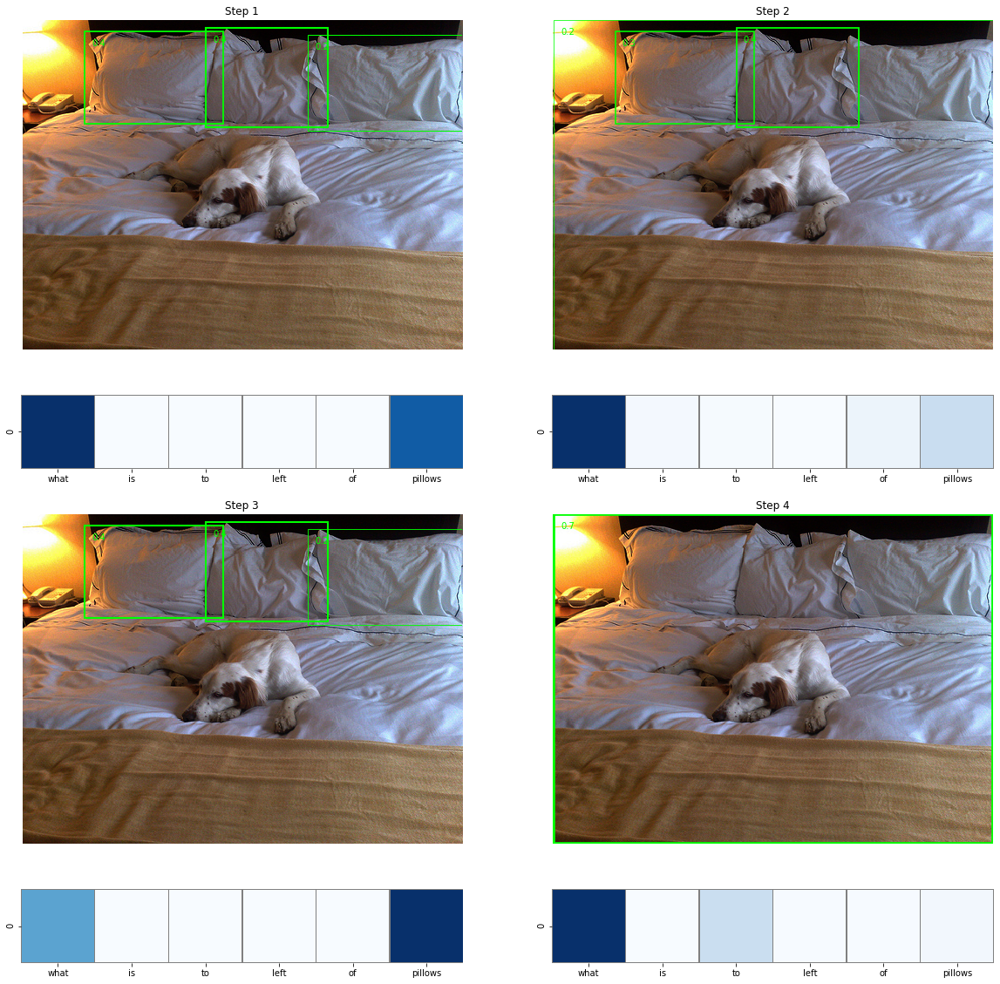

127.0.0.1 - - [03/Nov/2019 18:17:50] "POST /_dash-update-component HTTP/1.1" 200 -


what color is the blanket
2 2363979 what color is the blanket
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


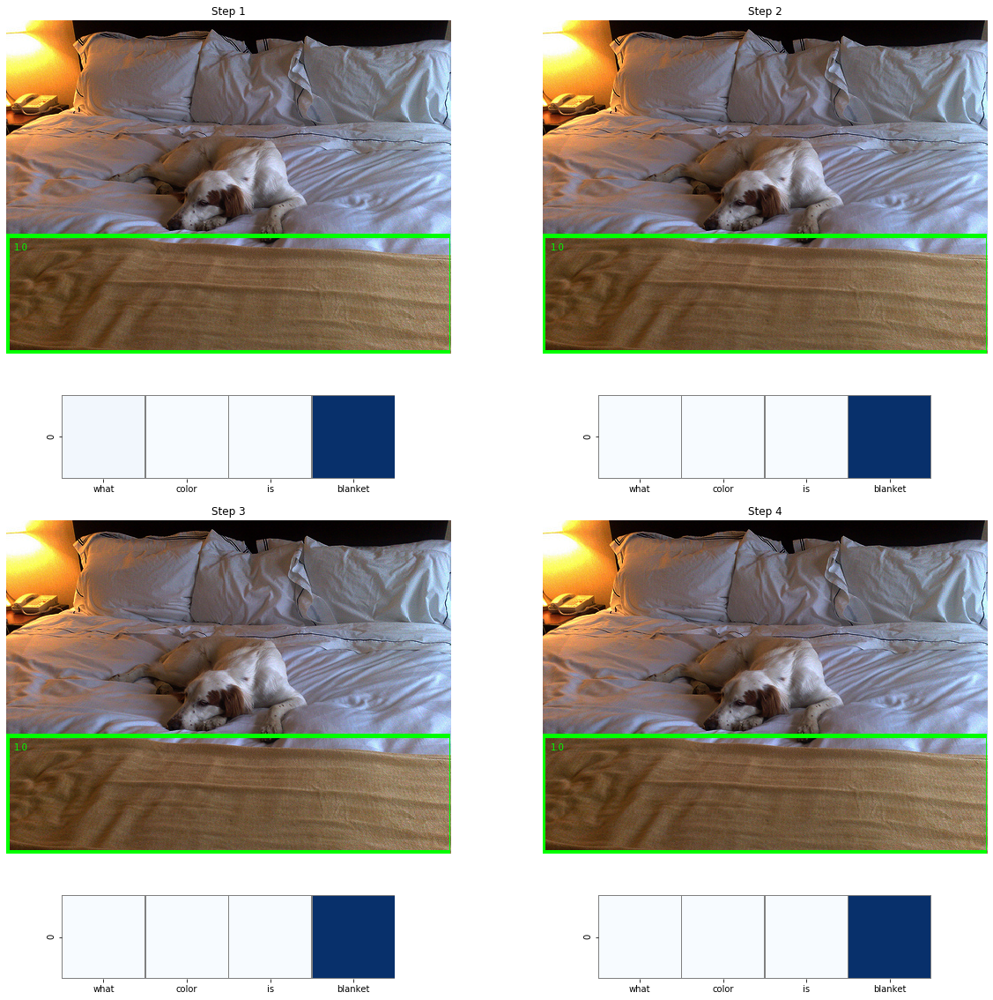

127.0.0.1 - - [03/Nov/2019 18:18:17] "POST /_dash-update-component HTTP/1.1" 200 -


what is lying on the bed
3 2363979 what is lying on the bed
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


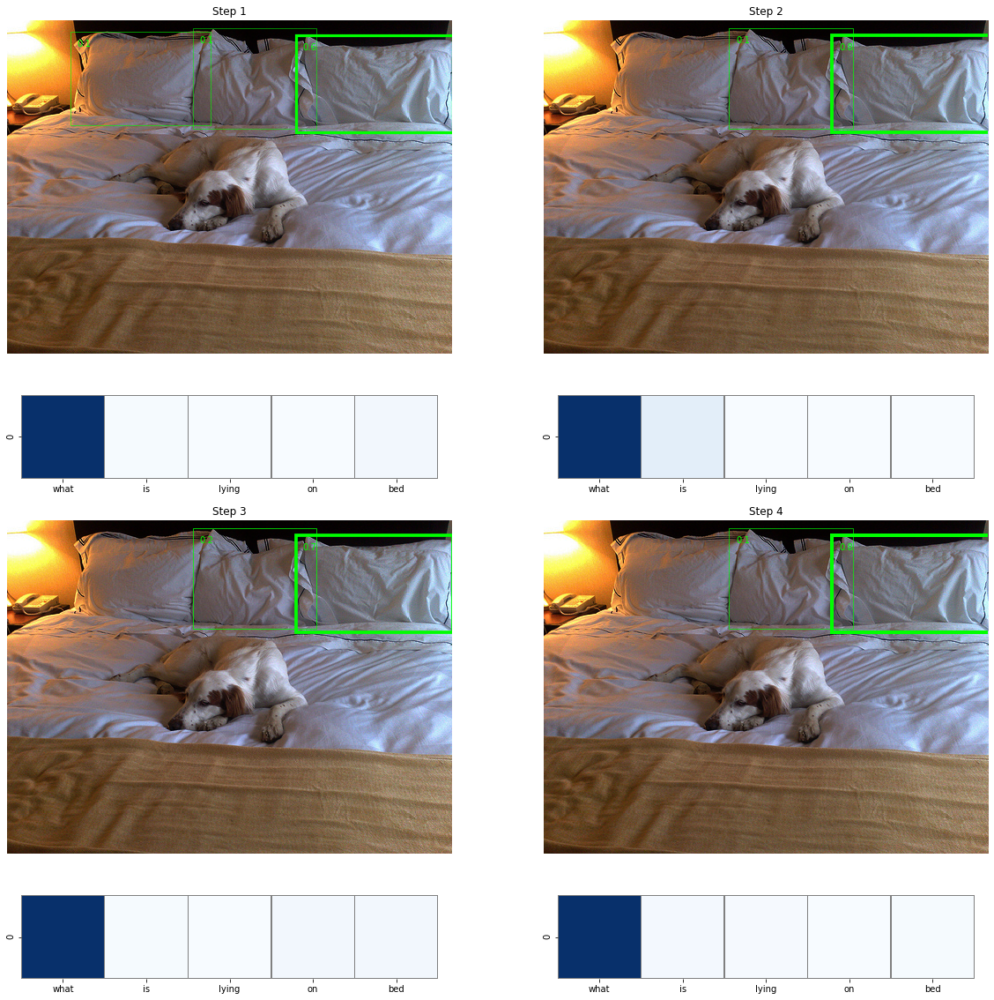

127.0.0.1 - - [03/Nov/2019 18:18:40] "POST /_dash-update-component HTTP/1.1" 200 -


what is the animal lying on the bed
4 2363979 what is the animal lying on the bed
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


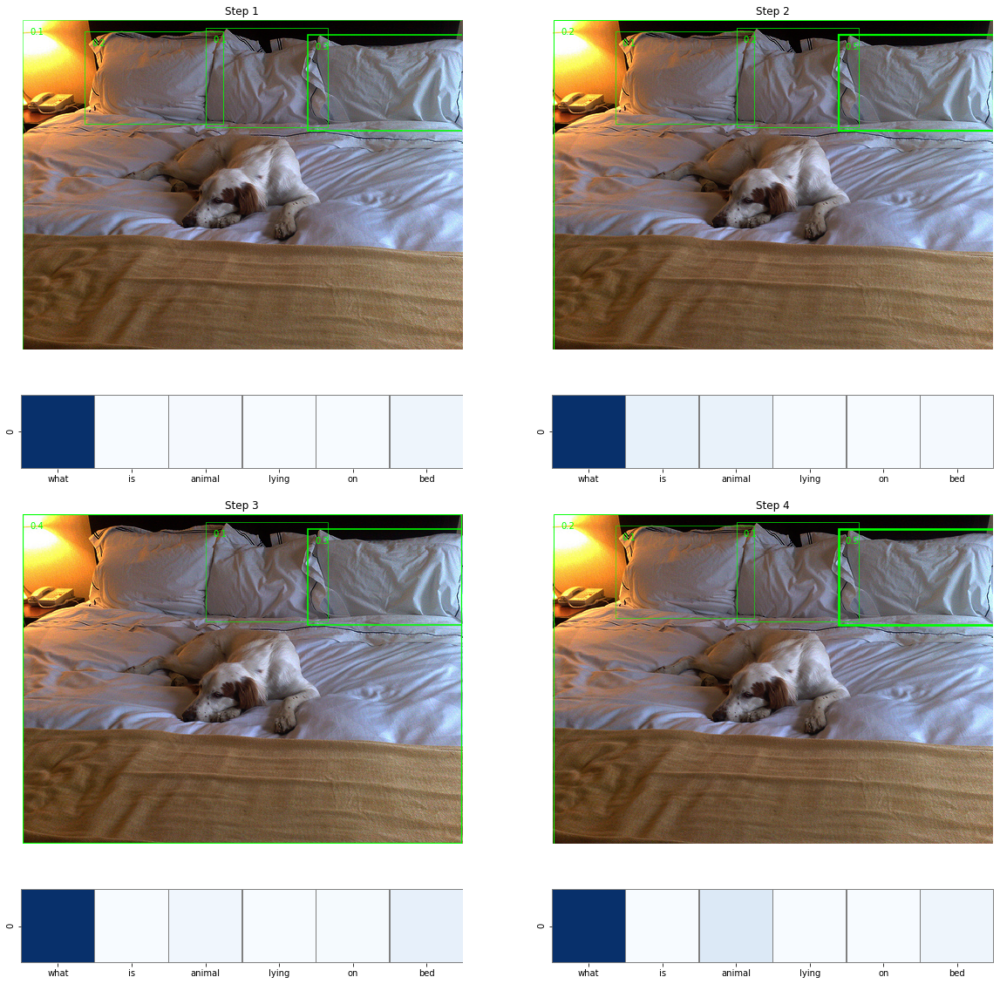

127.0.0.1 - - [03/Nov/2019 18:18:51] "POST /_dash-update-component HTTP/1.1" 200 -


what animal is lying on the bed
5 2363979 what animal is lying on the bed
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


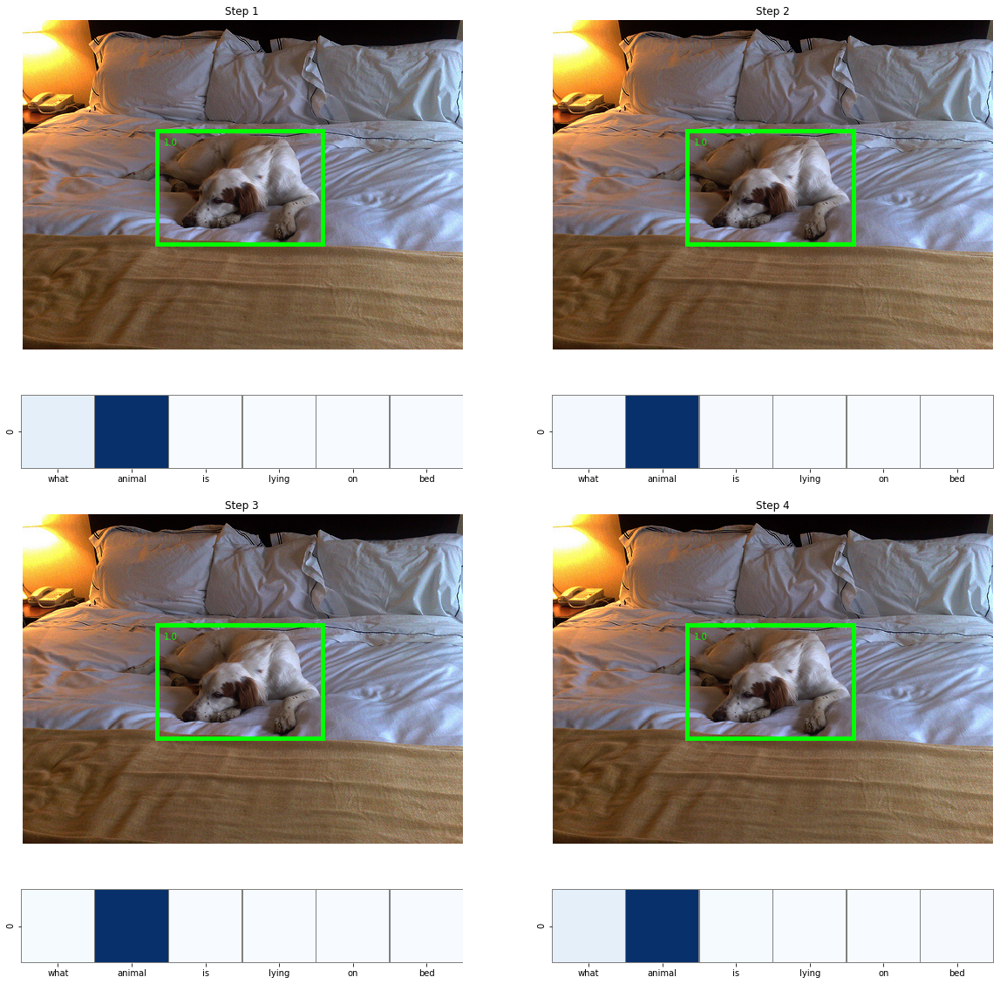

127.0.0.1 - - [03/Nov/2019 18:19:03] "POST /_dash-update-component HTTP/1.1" 200 -


what color is the dog
6 2363979 what color is the dog
{'width': 500, 'objectsNum': 15, 'height': 375, 'index': 76724}


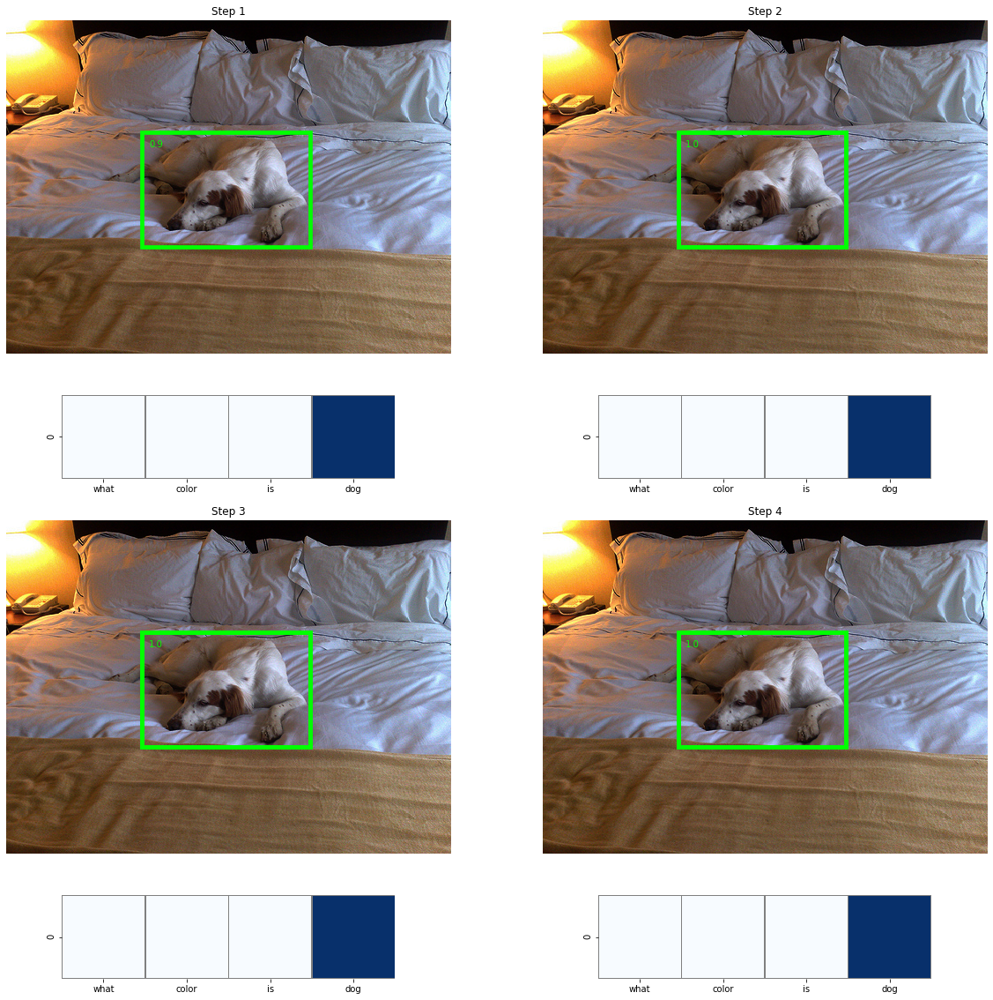

127.0.0.1 - - [03/Nov/2019 18:19:17] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:19:24] "POST /_dash-update-component HTTP/1.1" 200 -


what is the grill made of
7 2329177 what is the grill made of
{'width': 500, 'objectsNum': 11, 'height': 281, 'index': 77597}


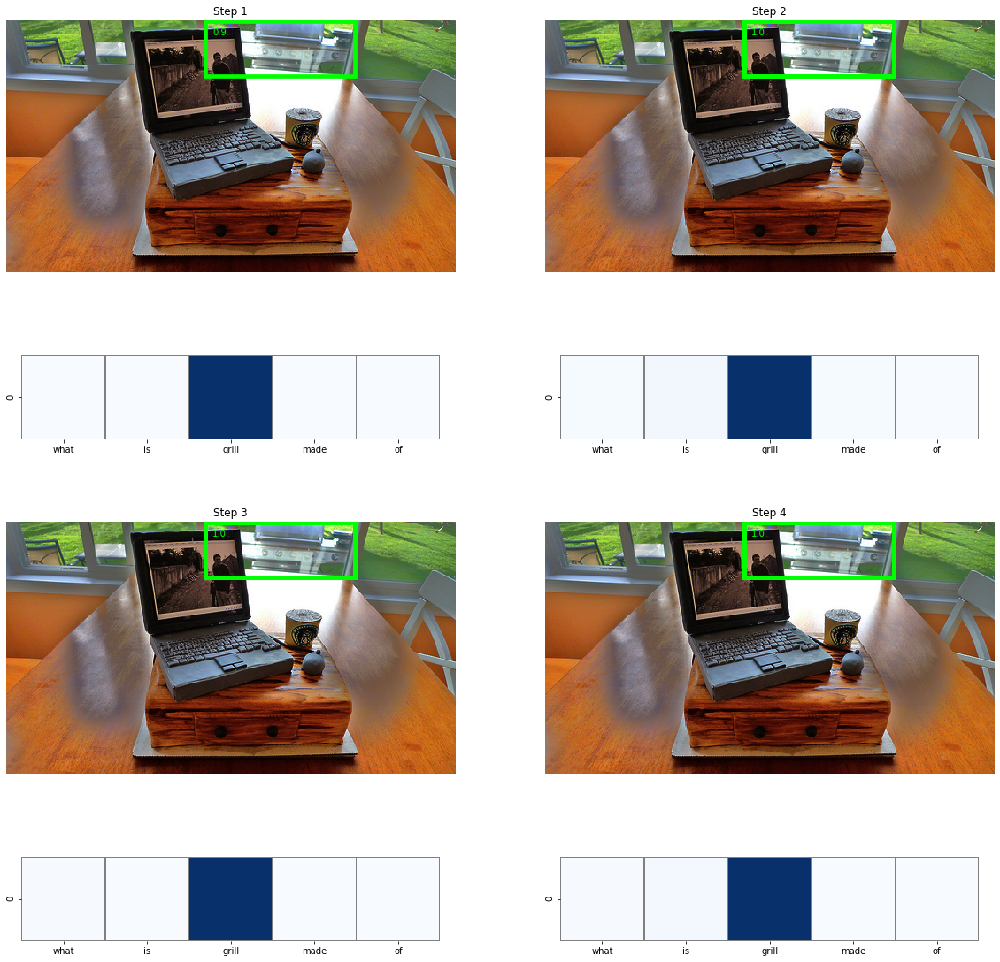

127.0.0.1 - - [03/Nov/2019 18:19:38] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:19:54] "POST /_dash-update-component HTTP/1.1" 200 -


are there people in front of the bridge
8 2412670 are there people in front of the bridge
{'width': 375, 'objectsNum': 30, 'height': 500, 'index': 78400}


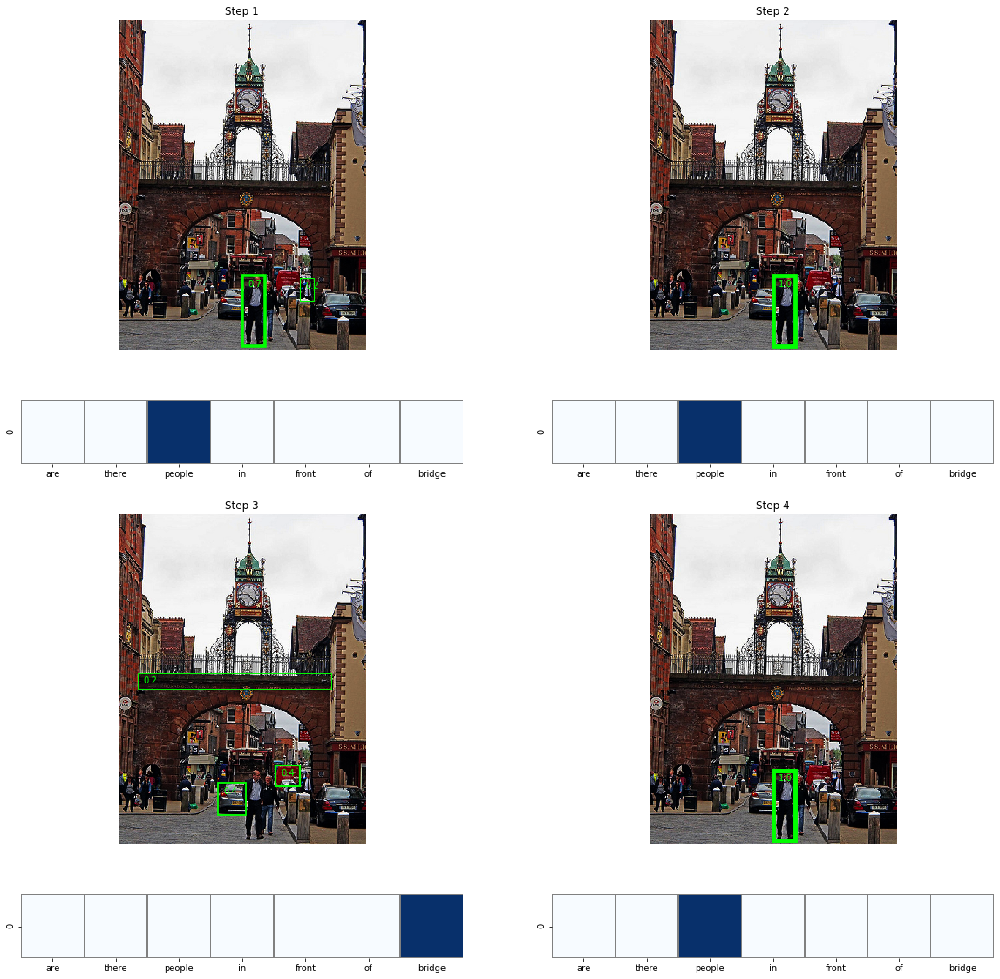

127.0.0.1 - - [03/Nov/2019 18:20:13] "POST /_dash-update-component HTTP/1.1" 200 -


what is in front of the clock tower
9 2412670 what is in front of the clock tower
{'width': 375, 'objectsNum': 30, 'height': 500, 'index': 78400}


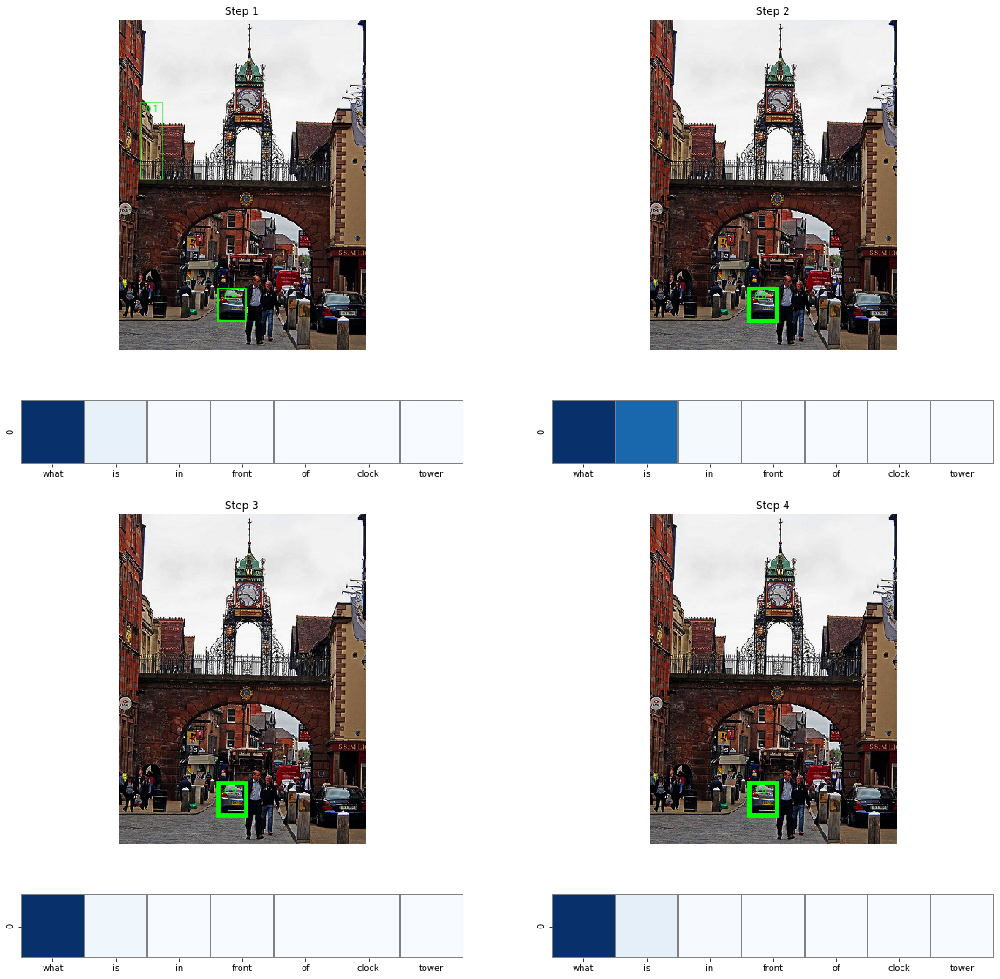

127.0.0.1 - - [03/Nov/2019 18:20:31] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:20:47] "POST /_dash-update-component HTTP/1.1" 200 -


what color is the bus on the right
10 2370909 what color is the bus on the right
{'width': 500, 'objectsNum': 17, 'height': 282, 'index': 78199}


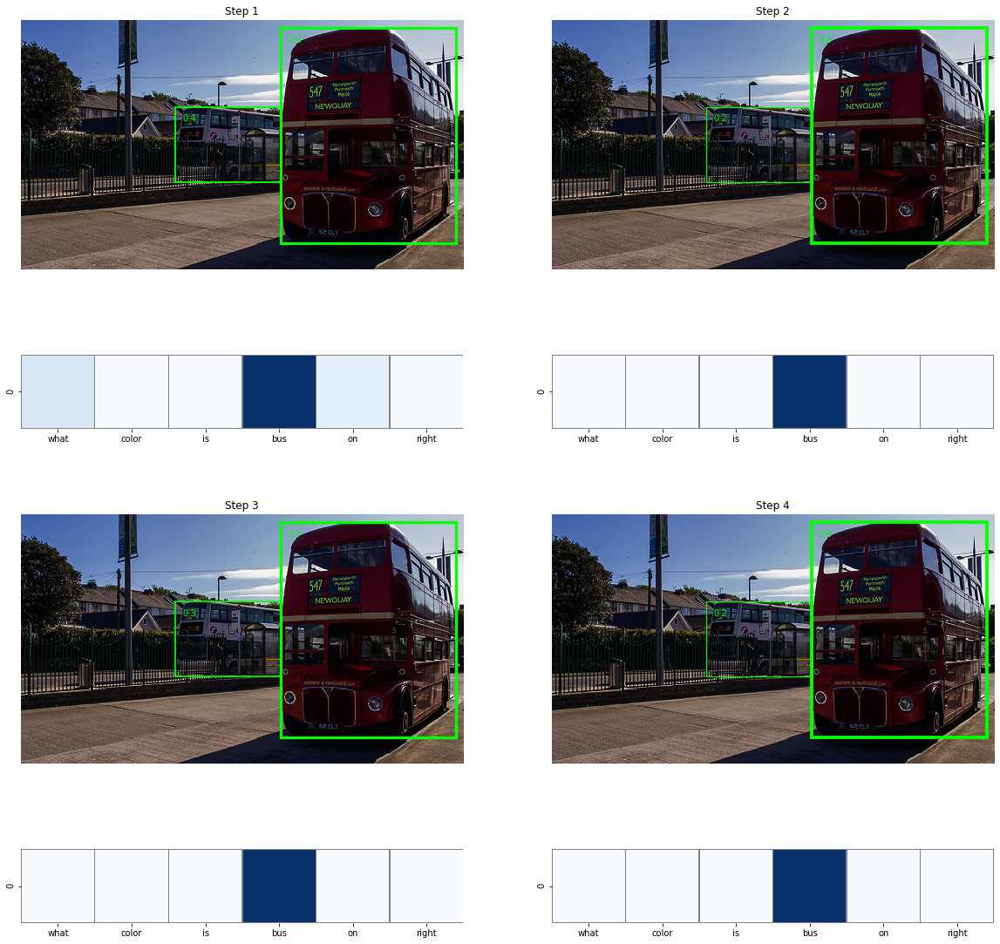

127.0.0.1 - - [03/Nov/2019 18:21:10] "POST /_dash-update-component HTTP/1.1" 200 -


what color is the bus on the left
11 2370909 what color is the bus on the left
{'width': 500, 'objectsNum': 17, 'height': 282, 'index': 78199}


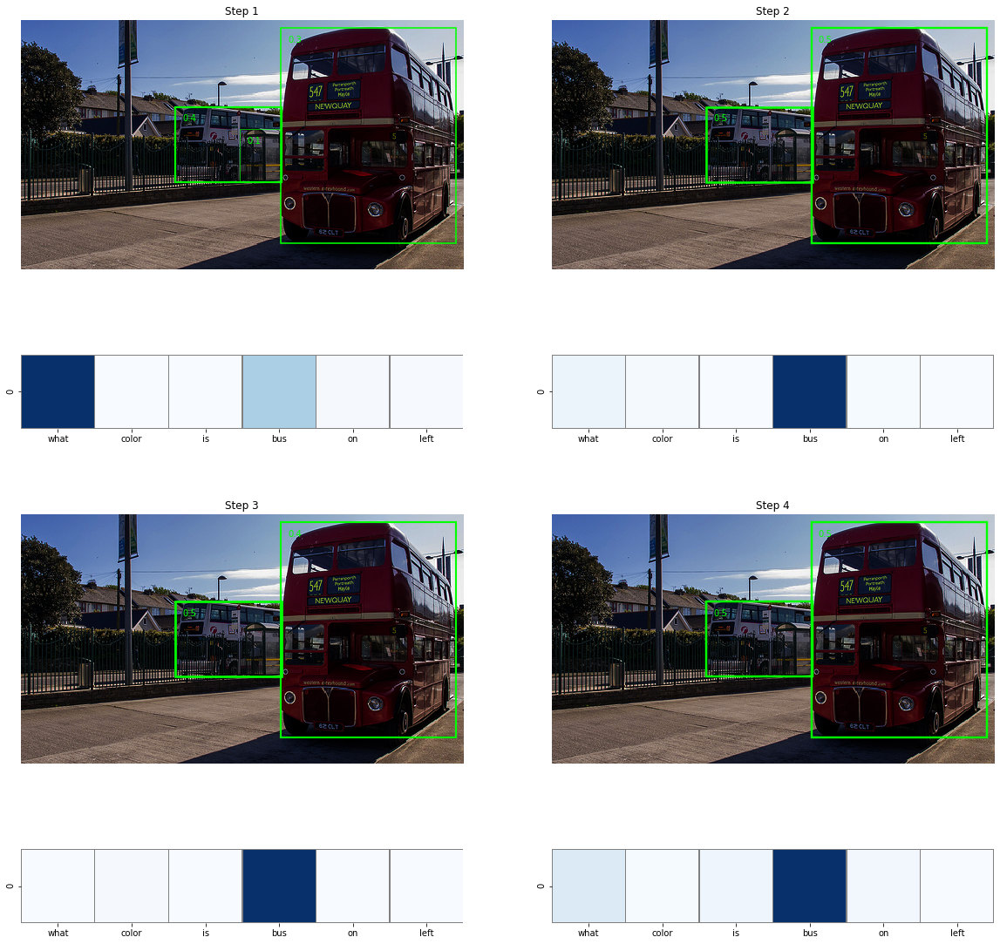

127.0.0.1 - - [03/Nov/2019 18:21:34] "POST /_dash-update-component HTTP/1.1" 200 -


what color is the bus on the right
12 2370909 what color is the bus on the right
{'width': 500, 'objectsNum': 17, 'height': 282, 'index': 78199}


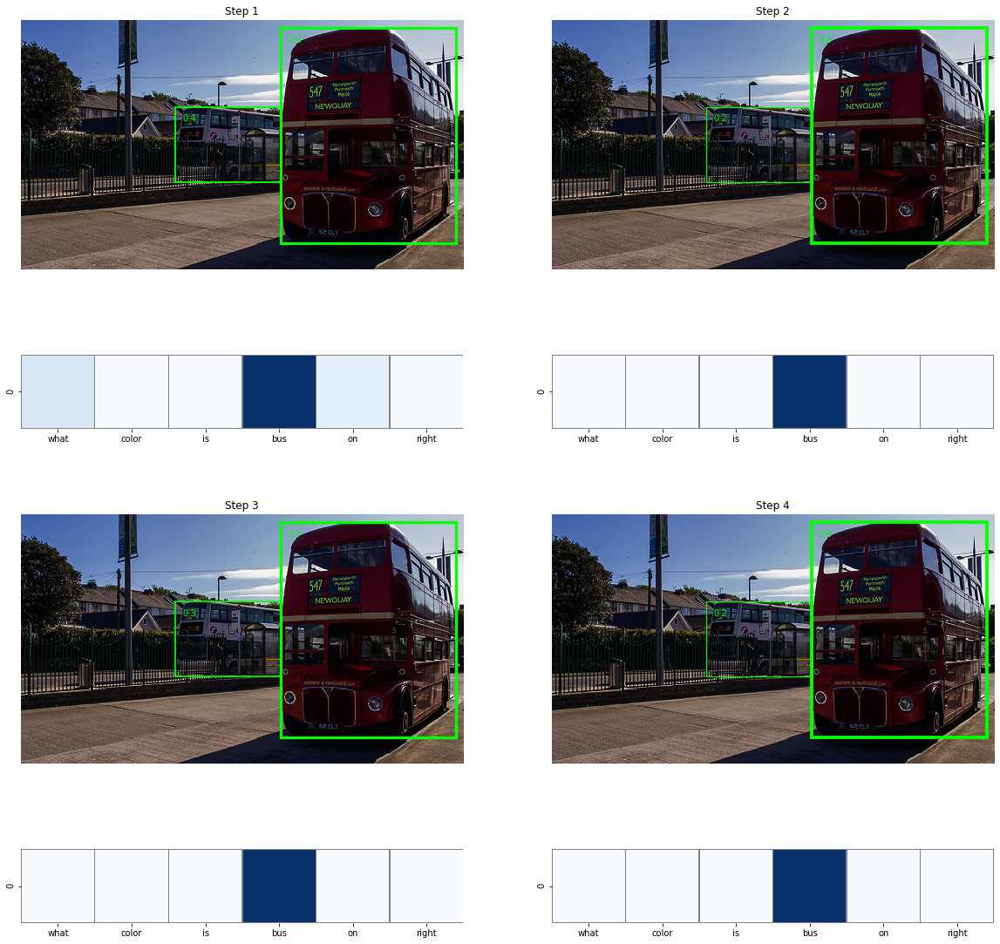

127.0.0.1 - - [03/Nov/2019 18:21:52] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [03/Nov/2019 18:25:32] "POST /_dash-update-component HTTP/1.1" 200 -


what is the man wearing
13 2347765 what is the man wearing
{'width': 500, 'objectsNum': 26, 'height': 375, 'index': 75498}


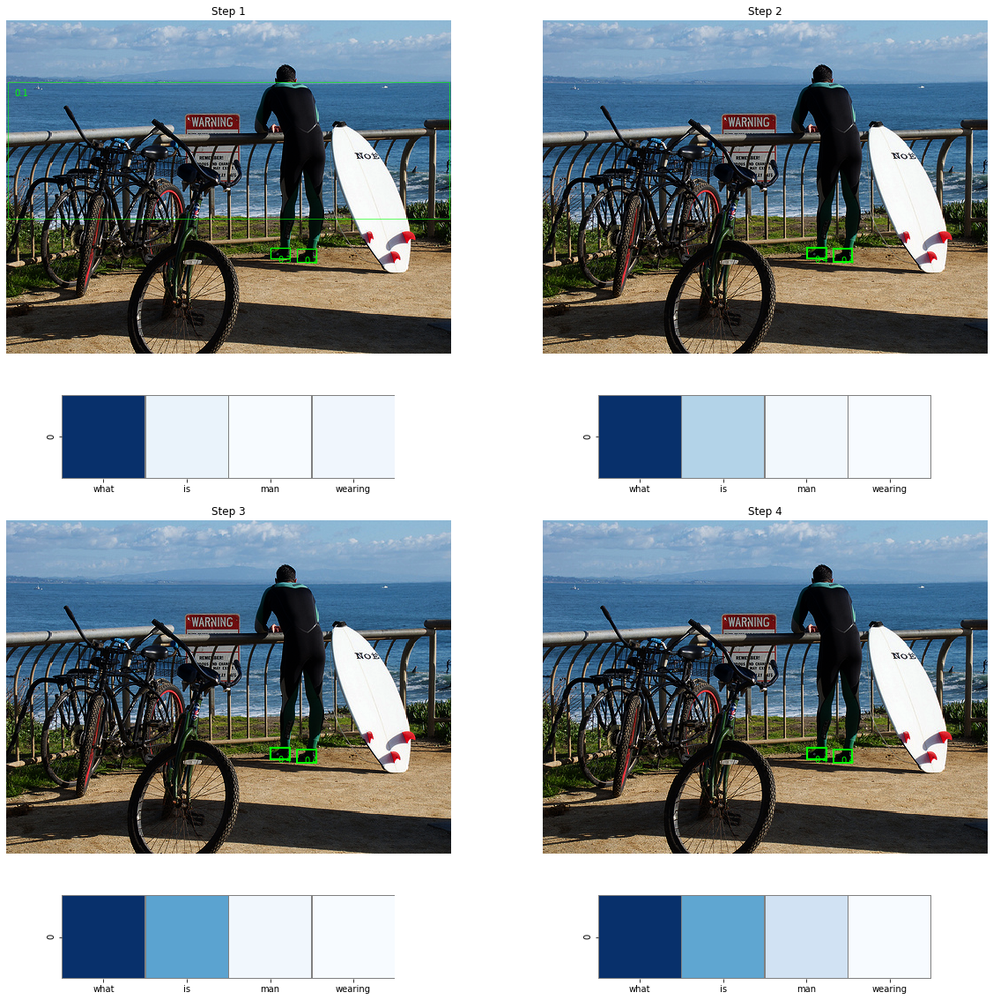

127.0.0.1 - - [03/Nov/2019 18:25:43] "POST /_dash-update-component HTTP/1.1" 200 -


what is the surfer wearing
14 2347765 what is the surfer wearing
{'width': 500, 'objectsNum': 26, 'height': 375, 'index': 75498}


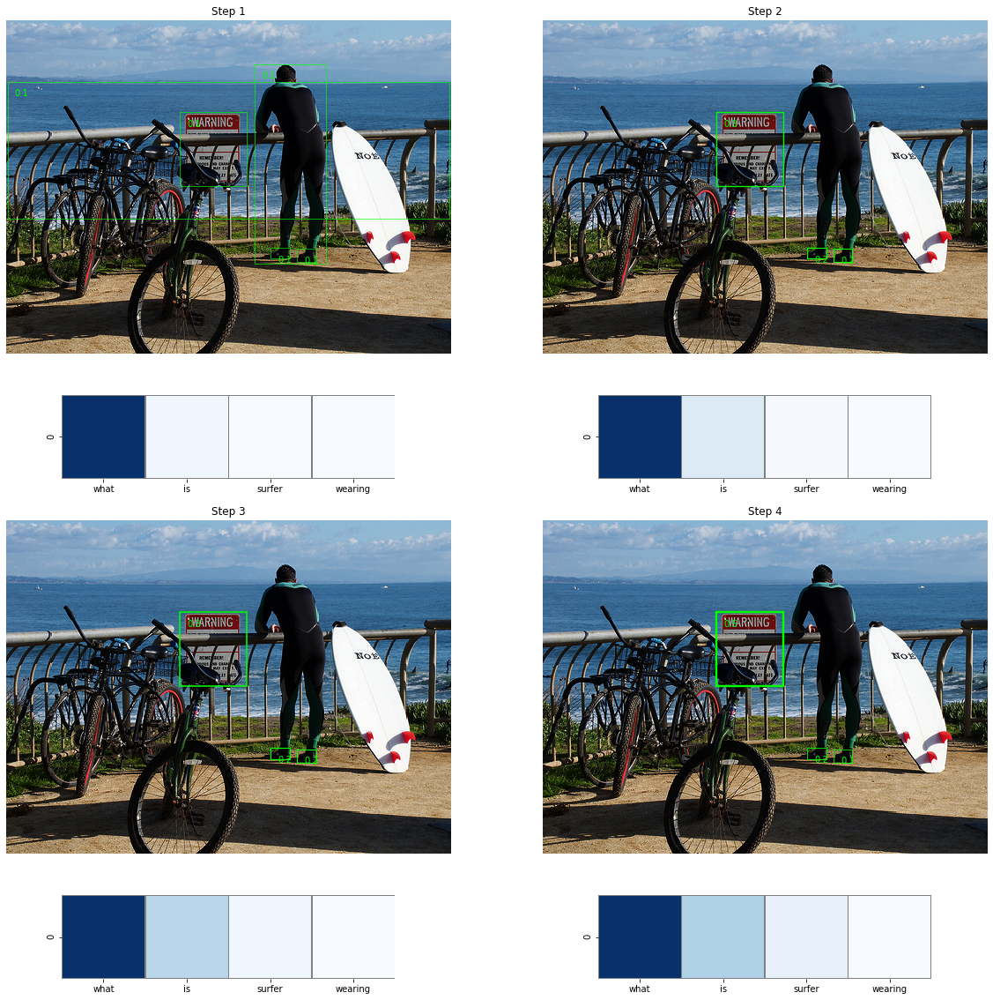

127.0.0.1 - - [03/Nov/2019 18:25:53] "POST /_dash-update-component HTTP/1.1" 200 -


what clothing is the surfer wearing
15 2347765 what clothing is the surfer wearing
{'width': 500, 'objectsNum': 26, 'height': 375, 'index': 75498}


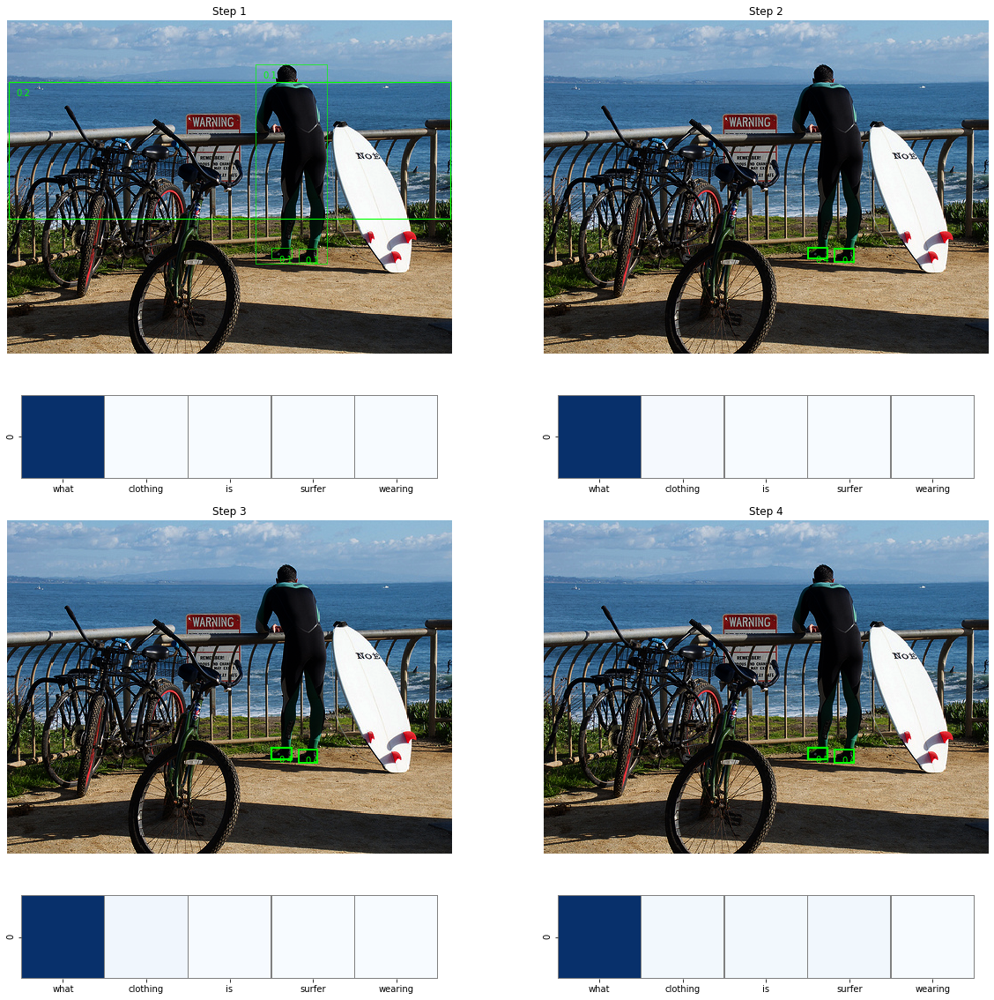

127.0.0.1 - - [03/Nov/2019 18:27:07] "POST /_dash-update-component HTTP/1.1" 200 -


what is the white object next to the surfer
16 2347765 what is the white object next to the surfer
{'width': 500, 'objectsNum': 26, 'height': 375, 'index': 75498}


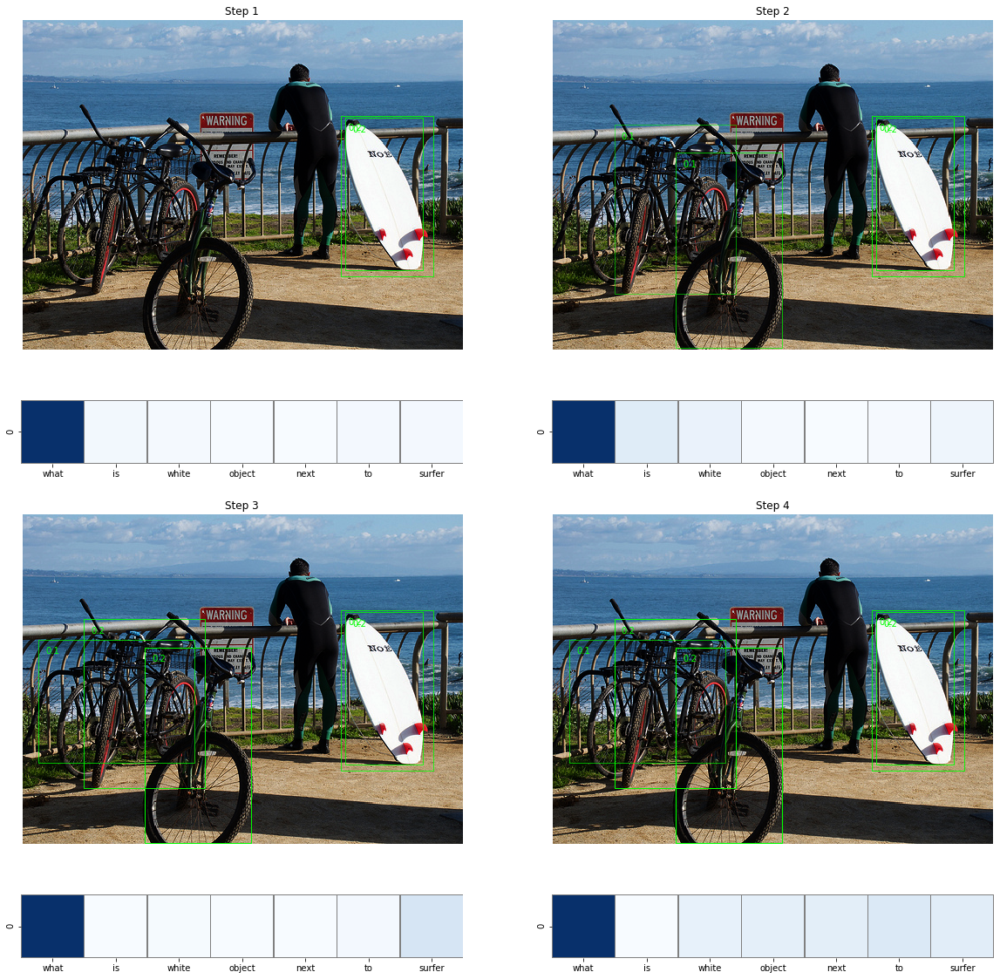

127.0.0.1 - - [03/Nov/2019 18:27:29] "POST /_dash-update-component HTTP/1.1" 200 -


what is the white object 
17 2347765 what is the white object 
{'width': 500, 'objectsNum': 26, 'height': 375, 'index': 75498}


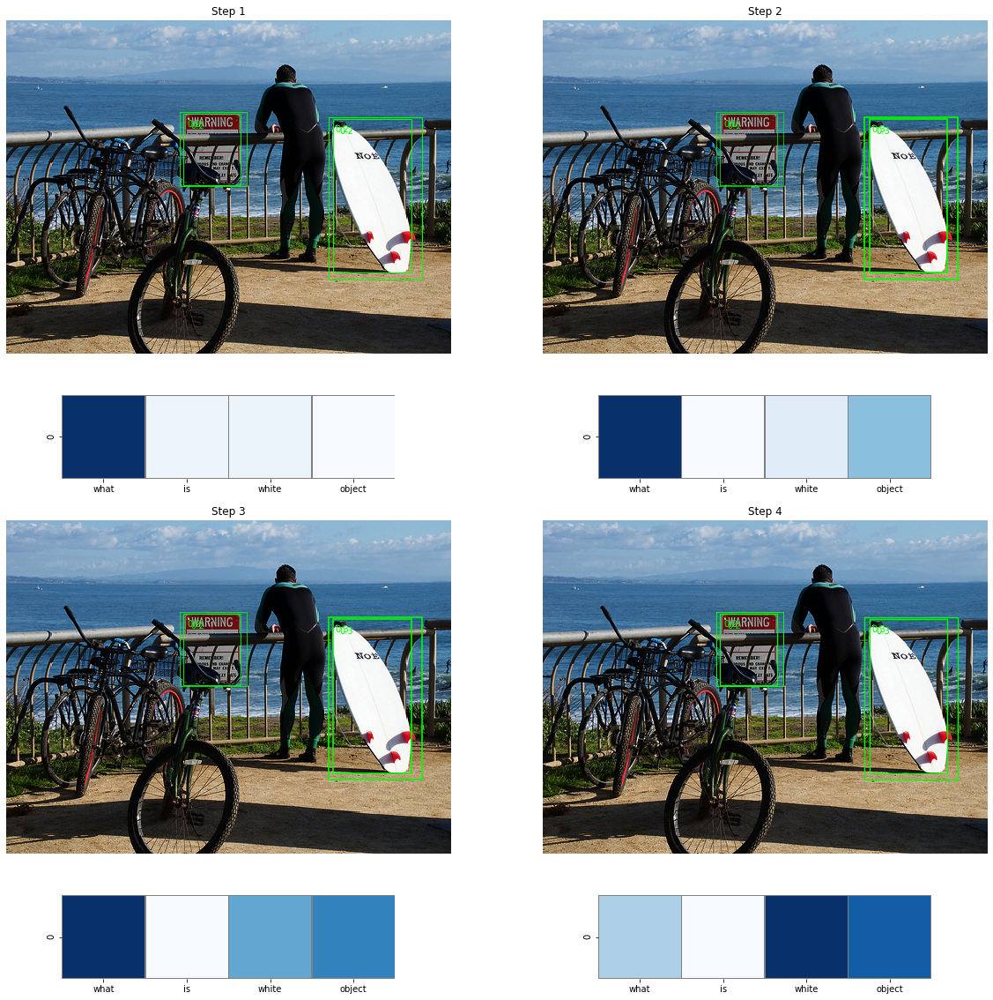

127.0.0.1 - - [03/Nov/2019 18:27:37] "POST /_dash-update-component HTTP/1.1" 200 -


In [ ]:
#import jupyterlab_dash
import dash
import dash_html_components as html
import dash_core_components as dcc
#import dash_bootstrap_components as dbc
import base64
import glob
import os
from os import path
import random

#file_objects = data_location+'gqa_objects_sg.h5'

data_obs = h5py.File(file_objects, 'r')

#file_merged_smy = data_location+'gqa_objects_sg_merged_info.json'

with open(file_merged_smy) as f:
    data_obs_mi = json.load(f)


image_list = ['2363979', '2329177', '2412670',  '2370909',  '2347765' ]
imageId = image_list[0]

#logo = base64.b64encode(open('D:/mac-network-gqa/data/usyd_logo.png', 'rb').read()).decode('ascii')
    
    
    
''' App Launcher'''
external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css', 'https://codepen.io/chriddyp/pen/brPBPO.css']

app = dash.Dash(__name__, external_stylesheets=external_stylesheets)

#viewer = jupyterlab_dash.AppViewer()

app.layout =  html.Div(children = [
    
        
        
        #Header
        #html.Div(html.Img(id = 'logo', src='data:image/png;base64,{}'.format(logo), 
        #             style={'Align': 'left', 'height' : '10%', 'width' : '10%', 'display' : 'inline-block'})),
            
            
        #html.Div(html.H2('CS59 - MAC Network', style={'color': 'white'}),
        #         style={'backgroundColor': '#E64626', 'marginBottom': 25,'padding': 10, 'display': 'inline-block'}), 
        
                html.Div(children =[
                    # Question Box
                    html.Div(children = [html.H1('Ask MAC:', style ={'backgroundColor': '#cb8756', 'color': 'white'}),
                    dcc.Input(id='input-box', type='text', style={'width': '25%', 'textAlign': 'center'}  ),
                    html.Button('Submit', id='button', style={'backgroundColor': '#D3D3D3', 'color':'white'})] ),
                    html.H3(id='container-button-basic', children='and MAC will make a prediction...'),
            
                    #Image
                    html.Img(id = 'image', style={'width': '60%'}), #Image Load
                    
                    #Radio Button
                    html.Div(dcc.RadioItems(id = 'scene_graph', options=[
                        {'label': 'Base Image', 'value': '1'},
                        {'label': 'Scene Graph', 'value': '2'}])),
        
                    #New image Button
                    html.Div([dcc.Input(id='imageid', type='text', value= imageId),
                    html.Button('Get New image', id='new-image', style={'backgroundColor': '#333333', 'color':'white'} )], style={'padding': 10})                           
                                ]),

                html.Div(children = [
                    #Attention Map Text
                    html.Div(html.H2('Attention Maps',style = {'backgroundColor': '#cb8756', 'textAlign':'center', 'color':'white' })),
        
                    #Attention Map Images
                    html.Div(html.Img(id = 'attention_image_1', 
                         style={'height': '100%', 'width': '100%', 'backgroundColor': '#333333'}))
                                    ]),

], style={ 'textAlign':'center', 'font':'BROTHER: 1816'})

#run forward pass on button click
@app.callback(
    [dash.dependencies.Output('container-button-basic', 'children'),
    dash.dependencies.Output('attention_image_1', 'src')],
    [dash.dependencies.Input('button', 'n_clicks')],
    [dash.dependencies.State('imageid', 'value'),
    dash.dependencies.State('input-box', 'value')])

def question_answer(n_clicks, imageId, questionStr):
    
    instance = None
    print(questionStr)
    
    if questionStr is not None:
    
        questionStr = str(questionStr)

        print(n_clicks, imageId, questionStr)


        with tf.Session(config = sessionConfig) as sess:

            # ensure no more ops are added after model is built
            sess.graph.finalize()

            # restore / initialize weights, initialize epoch variable
            epoch = loadWeights(sess, saver, init)

            trainRes, evalRes = None, None

            if config.interactive:
                if epoch > 0:
                    if config.useEMA:
                        emaSaver.restore(sess, config.weightsFile(epoch))
                    else:
                        saver.restore(sess, config.weightsFile(epoch))

                tier = config.interactiveTier
                images = data["main"][tier]["images"]

                imgsInfoFilename = config.imgsInfoFile(tier)
                with open(imgsInfoFilename, "r") as file:
                    imageIndex = json.load(file)  

                openImageFiles(images)

                resInter = {"preds": []}


                imageInfo = imageIndex[imageId]
                print(imageInfo)
                imageix = imageId
                imageId = {"group": tier, "id": imageId, "idx": imageInfo["index"]} # int(imageId)
                question = preprocessor.encodeQuestionStr(questionStr)
                instance = {
                    "questionStr": questionStr,
                    "question": question,
                    "answer": "yes", # Dummy answer
                    "answerFreq": ["yes"], # Dummy answer
                    "imageId": imageId,
                    "tier": tier,
                    "index": 0 
                }

                if config.imageObjects:
                    instance["objectsNum"] = imageInfo["objectsNum"]            

                datum = preprocessor.vectorizeData([instance])
                image = loadImageBatch(images, {"imageIds": [imageId]})
                res = model.runBatch(sess, datum, image, train = False, getPreds = True, getAtt = True)
                resInter["preds"].append(instance)


                if config.getPreds:
                    print(bcolored("Writing predictions...", "white"))
                    preprocessor.writePreds(resInter, "interactive".format())

                closeImageFiles(images)


                # get bboxes
                bboxes = data_obs['bboxes'][data_obs_mi[str(imageix)]['index']]

                #images
                fig, axes = plt.subplots(4, 2, figsize = (20,20), gridspec_kw = {'height_ratios' : [4,1,4,1]})


                for row in [0,2]:
                    for col in [0,1]:
                        image_ax= axes[row,col]
                        word_ax = axes[row+1,col]
                        step = row+col+1


                        attentions_objects = instance['attentions']['kb'][step -1]
                        generate_image_map(imageix, bboxes, attentions_objects, image_ax,step)

                        q_vector = instance['question']
                        attentions_question = instance['attentions']['question'][step -1][0:len(q_vector)]
                        generate_question_map(q_vector, attentions_question, word_ax)

                plt.show()

                src = fig_to_uri(fig)
            
    else:
        src = 'None'
            
    return 'Prediction {}: {}'.format(n_clicks,instance["prediction"]), src

    
#change images on button click
@app.callback(
    [dash.dependencies.Output('image', 'src'),
     dash.dependencies.Output('imageid', 'value')],
    [dash.dependencies.Input('new-image', 'n_clicks'),
    dash.dependencies.Input('scene_graph', 'value')])

def update_image_src(n_clicks,value):
    
    if n_clicks is None:
        n_clicks = 0
    
    index_counter = int(n_clicks / 5 % 1 * 5)
    imageId = image_list[index_counter]

 
    fig = scene_graph(imageId, value)
    src_image = fig_to_uri(fig)
    
    return src_image, imageId



if __name__ == '__main__':
    app.run_server(debug=False, port=8056, use_reloader=False, threaded=False)
